In [1]:
%config Completer.use_jedi = False
import scanpy as sc
import pandas as pd
sc.set_figure_params(dpi = 120)
from matplotlib import pyplot as plt
import seaborn as sns
import os

import matplotlib.pyplot as plt

# create a color dictionary for tissues
def tissue_colors():
    
    tissue_color_dict = {'Bladder': '#e7969c',
             'Blood': '#d6616b',
             'Bone_Marrow': '#cedb9c',
             'Eye': '#c7ea46',#"#00ff7f",
             'Fat': '#e7cb94',
             'Heart': '#ff0800',
             'Kidney': '#7b4173',
             'Large_Intestine': '#31a354',
             'Liver': '#000080',
             'Lung': '#3182bd',
             'Lymph_Node': '#8c6d31',
             'Mammary':'#ce6dbd',
             'Muscle': '#e7ba52',
             'Pancreas': '#fd8d3c',
             'Prostate':'#637939',#'#a55194',#
             'Salivary_Gland':'#622a0f',
             'Skin': '#de9ed6',
             'Small_Intestine': '#6baed6',
             'Spleen': '#393b79',
             'Thymus': '#9c9ede',
             'Tongue':'#b5cf6b',
             'Trachea': '#969696',
             'Uterus':'#c64b8c',#'#ff0090',
             'Vasculature': '#843c39'}
    
    return tissue_color_dict

def _pp(adata, log, normalize, remove_dissociation):
    if log:
        sc.pp.log1p(adata, chunk_size=50000)
    if normalize:
        sc.pp.normalize_total(adata)
    if remove_dissociation:
    #mouse2human = pd.read_csv('../metadata/mouse2human.csv')
        dissociation_genes = pd.read_csv('../metadata/Mouse2Human_dissociation_genes.csv')
        adata.var['not_dissociation_gene'] = ~adata.var.index.isin(dissociation_genes['Human gene name'])
        adata = adata[:, adata.var.not_dissociation_gene == True]
    return adata

In [3]:
pd.set_option('display.max_rows', 300)
_tissue_colors = tissue_colors()


pd.set_option('display.max_rows', 300)


In [5]:
cell_label = 'cell_ontology_class'
# cannot currently read this object because it kills my kernel
adata = sc.read_h5ad('../data/h5ads/TSP1_TSP15_scvi_donor-method_normalized-log1p-scaled_annotated.h5ad', backed='r+')

In [6]:
# subset to circulating cell types
cell_types_in_Blood = adata.obs.groupby('tissue')[cell_label].value_counts().xs('Blood')
circulating_cell_types = cell_types_in_Blood[cell_types_in_Blood > 30]

adata = adata[adata.obs.cell_ontology_class.isin(circulating_cell_types.index)]


In [7]:
adata = adata.to_memory()

In [8]:

adata = _pp(adata, True, True, False)


# filter out tissue defining genes as sources of ambient RNA noise or doublets
sc.tl.rank_genes_groups(adata, groupby='tissue')

sc.tl.filter_rank_genes_groups(adata, min_fold_change=1)

result = _sub_adata.uns['rank_genes_groups_filtered']
groups = result['names'].dtype.names
gene_df = pd.DataFrame(
    {group + '_' + key[:]: result[key][group]
     # Get Each Clusters 10 top Genes
    for group in groups for key in ['names', 'pvals']})

x = result['names']

# flattening wasn't working
genes = []
for i in x:
    for gene in i:
        genes.append(gene)

tissue_genes = pd.Series(genes)

tissue_genes = tissue_genes.dropna().drop_duplicates()

adata = adata[:,~adata.var.index.isin(tissue_genes)]

In [21]:
print(adata.obs.groupby('tissue').cell_ontology_class.value_counts())

tissue           cell_ontology_class                                        
Bladder          macrophage                                                      5338
                 plasma cell                                                     1141
                 nk cell                                                          508
Blood            erythrocyte                                                    10494
                 monocyte                                                        8972
                 neutrophil                                                      8432
                 classical monocyte                                              7220
                 nk cell                                                         2948
                 cd4-positive, alpha-beta t cell                                 2863
                 naive b cell                                                    2245
                 cd8-positive, alpha-beta cytokine secreting ef

In [4]:
# start iterating through the cell types 
cell_type = 'cd8-positive, alpha-beta t cell'

_sub_adata = adata[adata.obs.cell_ontology_class == cell_type]

NameError: name 'adata' is not defined

In [11]:
label = 'tissue'

In [12]:
# subset to tissues with more than 10 members of this particular cell class
_df = pd.DataFrame(_sub_adata.obs.groupby(label)[cell_label].value_counts() > 10)

_tissues = _df[_df.cell_ontology_class == True].unstack().index.to_list()

_sub_adata = _sub_adata[_sub_adata.obs.tissue.isin(_tissues)]

In [14]:
sc.tl.rank_genes_groups(_sub_adata, groupby=label, method='wilcoxon')

sc.tl.filter_rank_genes_groups(_sub_adata, min_fold_change=0.5)

Trying to set attribute `.uns` of view, copying.
/home/michaelswift/miniconda3/envs/scirpy/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:416: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/michaelswift/miniconda3/envs/scirpy/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:417: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
/home/michaelswift/miniconda3/envs/scirpy/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:416: RuntimeWarning: invalid value encountered in true_divide
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/michaelswift/miniconda3/envs/scirpy/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:419: RuntimeWarning: divide by zero encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


/home/michaelswift/miniconda3/envs/scirpy/lib/python3.8/site-packages/seaborn/axisgrid.py:392: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


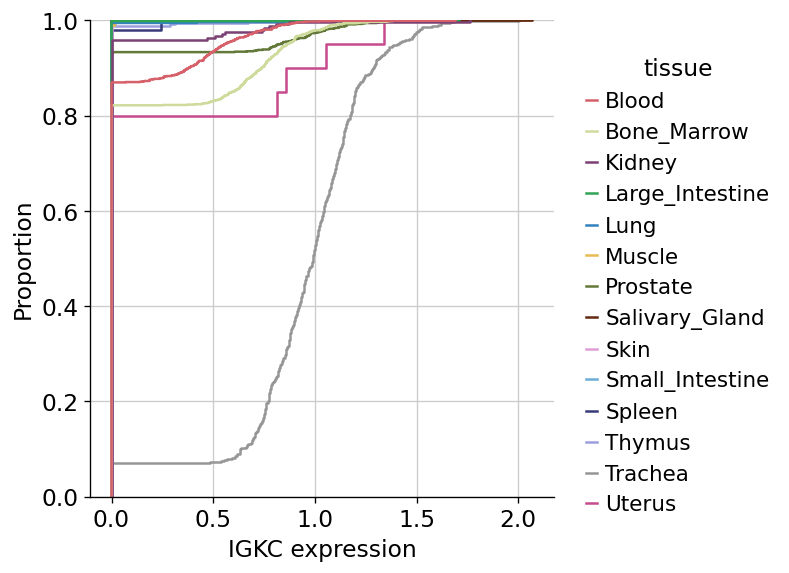

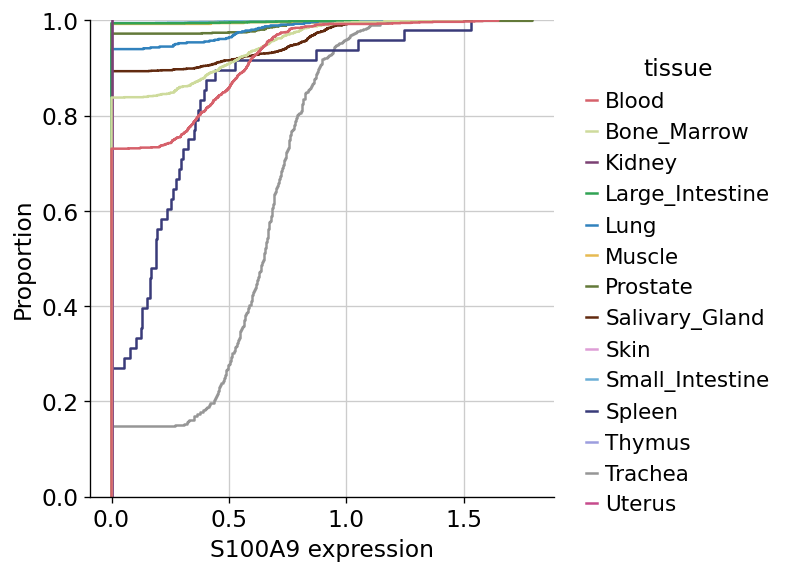

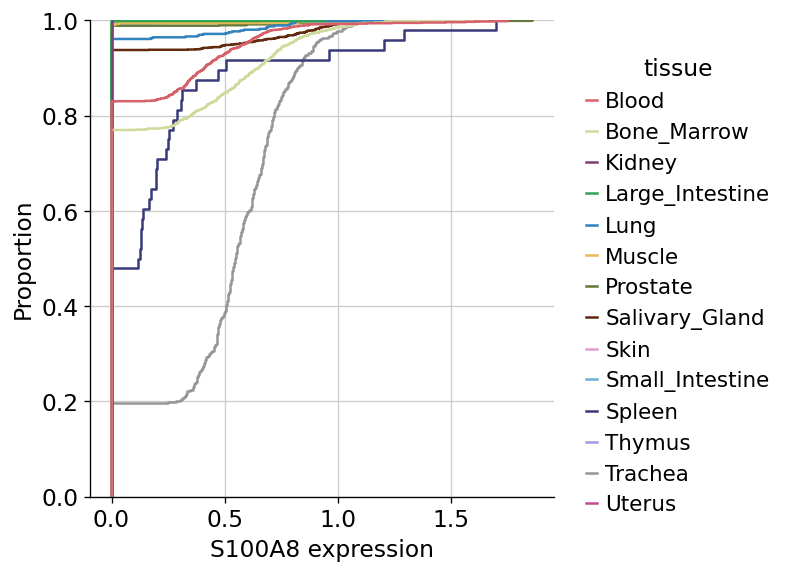

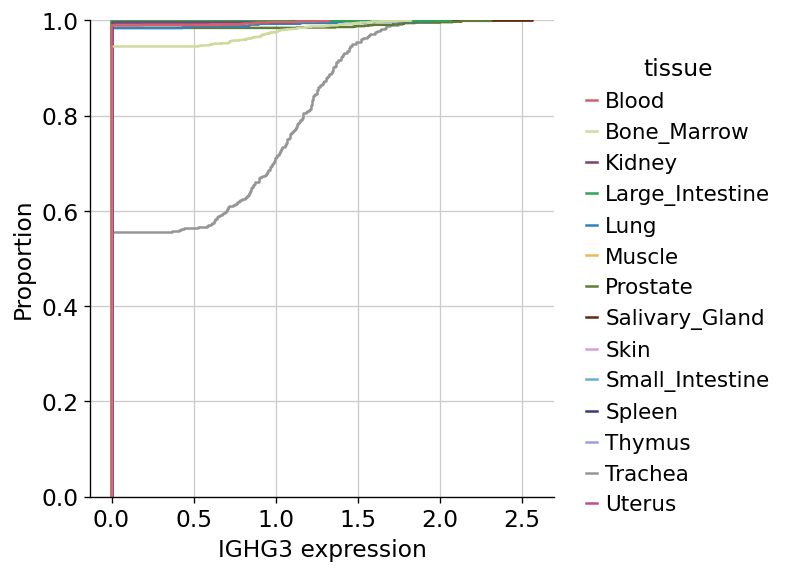

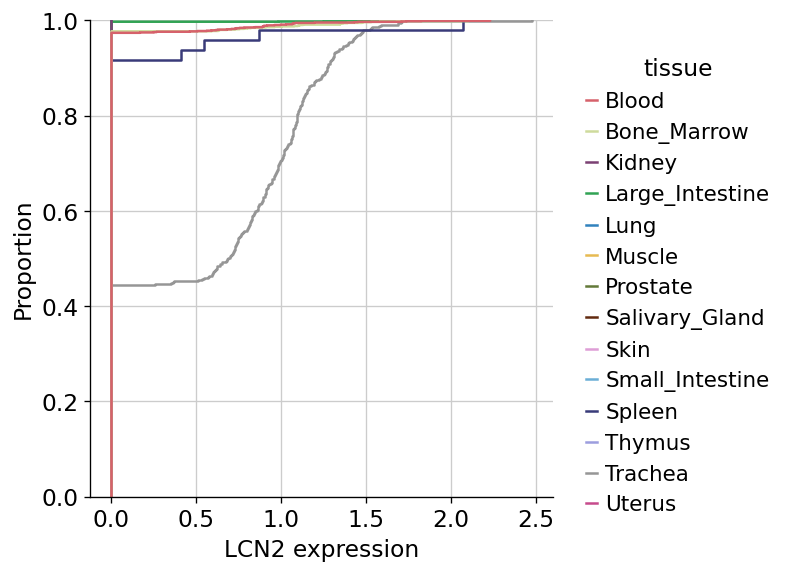

...

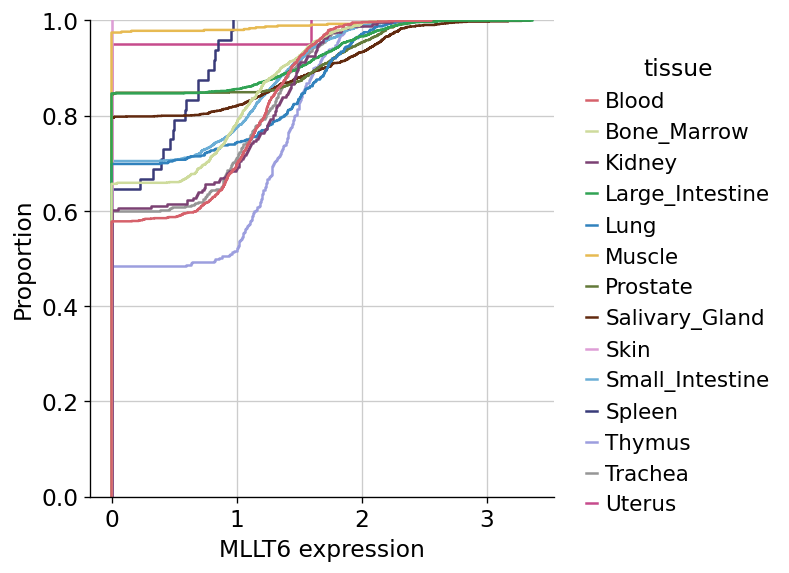

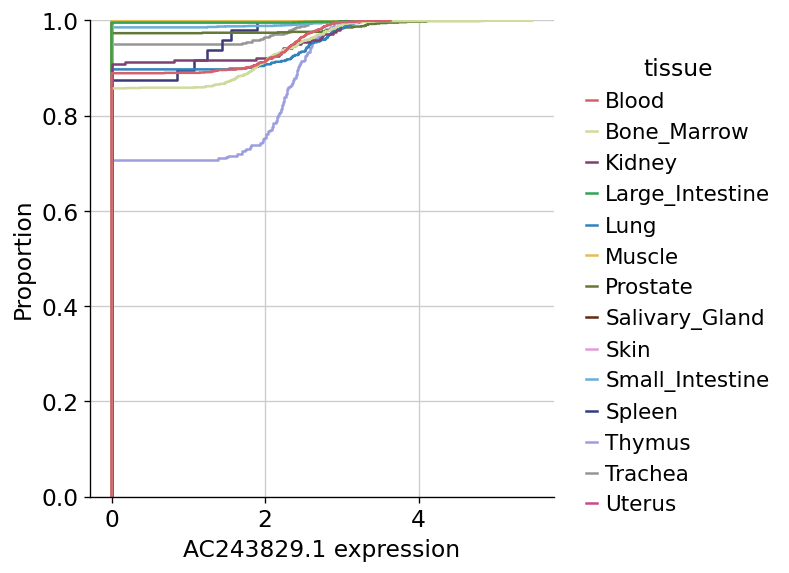

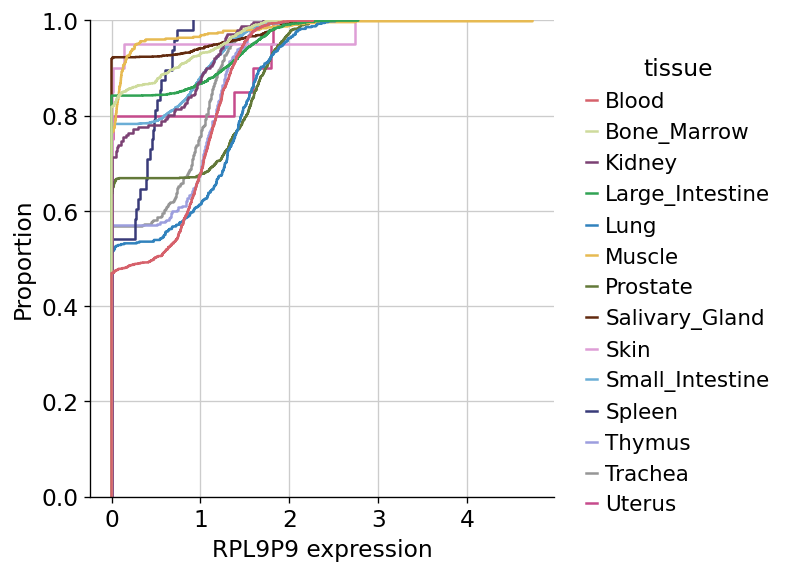

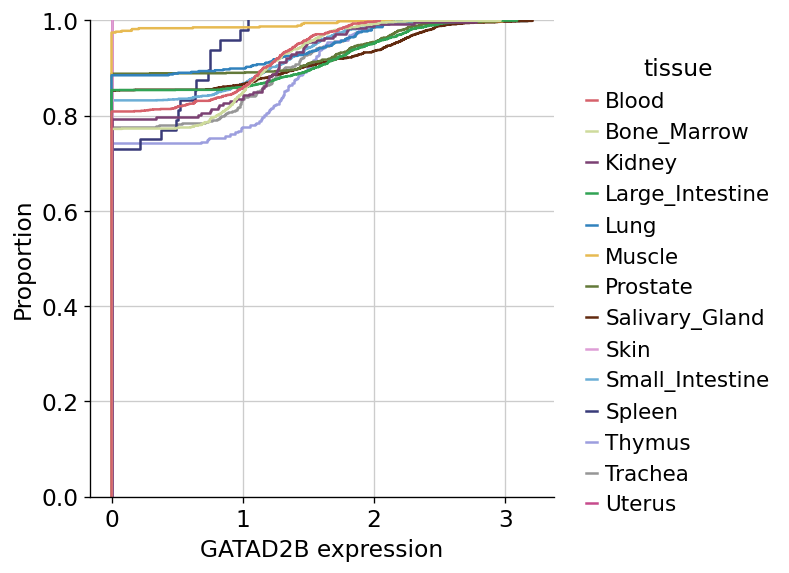

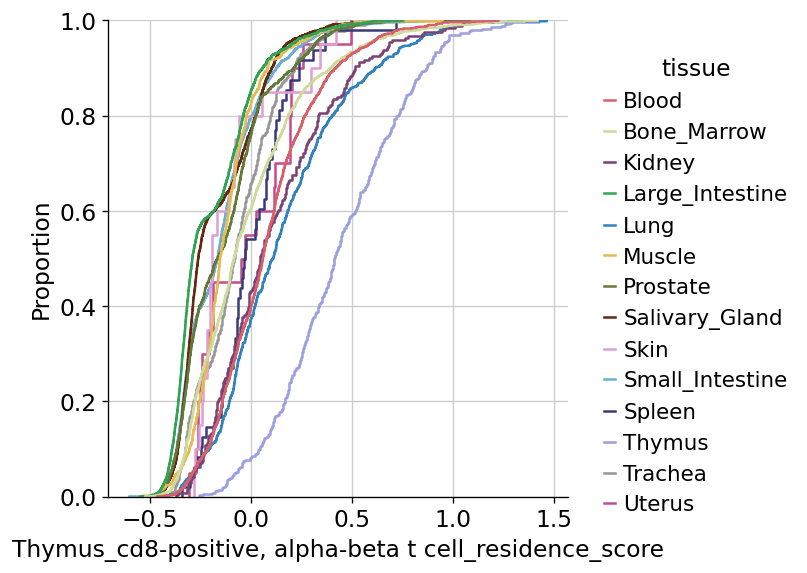

In [36]:
result = _sub_adata.uns['rank_genes_groups_filtered']
groups = result['names'].dtype.names
gene_df = pd.DataFrame(
    {group + '_' + key[:]: result[key][group]
     # Get Each Clusters 10 top Genes
    for group in groups for key in ['names', 'pvals']})


#iterate thru the unique tissues
for tis in _sub_adata.obs[label].unique():

    # reset rank genes df for new organ
    _gene_df = gene_df.copy()
     # Drop the filtered genes
    _gene_df = _gene_df[[tis + '_names', tis + '_pvals']].dropna()
    gene_list = _gene_df[tis + '_names'].to_list()
    genes = gene_list
    score_name = tis + '_' + cell_type + "_residence_score"
    sc.tl.score_genes(_sub_adata, gene_list = gene_list, score_name = score_name, use_raw = False)
    plotdf = sc.get.obs_df(
            _sub_adata,
            keys=genes +[label, score_name])
    for gene in genes[:10]:
        g = sns.displot(data = plotdf, x = gene, hue = label, kind='ecdf', palette=tissue_colors
                       )
        g.set_titles(cell_type)
        g.set_xlabels(gene + ' expression')
        directory = 'figures/label_Residency/{}_{}/'.format(cell_type, tis)
        if not os.path.exists(directory):
            os.makedirs(directory)
        g.savefig('figures/label_Residency/{}_{}/{}.png'.format(cell_type, tis, gene))
    g = sns.displot(data = plotdf, x=score_name, hue = label, kind = 'ecdf', palette=tissue_colors)
    g.savefig('figures/label_Residency/{}'.format(score_name))

# ISOTYPE Plots

In [146]:
_sub_adata = adata[adata.obs.cell_ontology_class.str.contains('b cell|plasma cell')]

IGHG_genes = ['IGHG1', 'IGHG2', "IGHG3", "IGHG4"]
IGHA_genes = ['IGHA1', 'IGHA2']
IGHMD_genes = ["IGHM", "IGHD"]
IGH_genes = ['IGHM', 'IGHD', "IGHE"] + IGHA_genes + IGHG_genes
sc.tl.score_genes(_sub_adata
                  , gene_list=IGHG_genes, 
                  score_name='IgG_Score')
sc.tl.score_genes(_sub_adata, gene_list=IGHA_genes, 
                  
                  score_name='IgA_Score')
sc.tl.score_genes(_sub_adata, gene_list=IGHMD_genes, 
                 
                  score_name='IgMD_Score')

sc.pl.violin(_sub_adata, keys=['IgG_Score', 'IgA_Score'], groupby='tissue', log=True)

In [175]:
plotdf = sc.get.obs_df(
                _sub_adata,
                keys=['IGHD', 'IGHG1', "IGHG2", 'IGHG4', 'IGHG3', 'IGHA1', "IGHA2", "IGHM", 'IGHE', 'tissue', 'IgG_Score', 'IgA_Score', 'IgMD_Score', 'cell_ontology_class'], layer = "raw_counts" )

In [176]:
plotdf.tissue.value_counts()

Spleen             10675
Lymph_Node          7341
Thymus              4391
Salivary_Gland      4344
Blood               3588
Bone_Marrow         1289
Bladder             1141
Large_Intestine      330
Small_Intestine      303
Mammary              194
Lung                 142
Trachea              138
Pancreas              63
Liver                 47
Eye                   46
Vasculature           42
Skin                  41
Fat                   26
Uterus                19
Name: tissue, dtype: int64

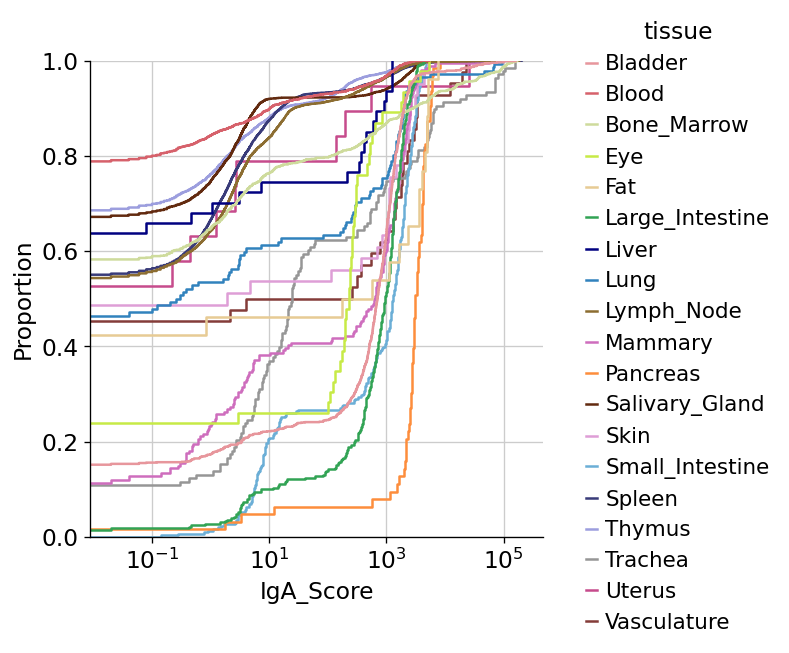

In [177]:
gene = 'IgA_Score'
label = 'tissue'
g = sns.displot(data = plotdf, x = gene, hue = label, kind='ecdf', palette=tissue_colors )
plt.xscale('log')

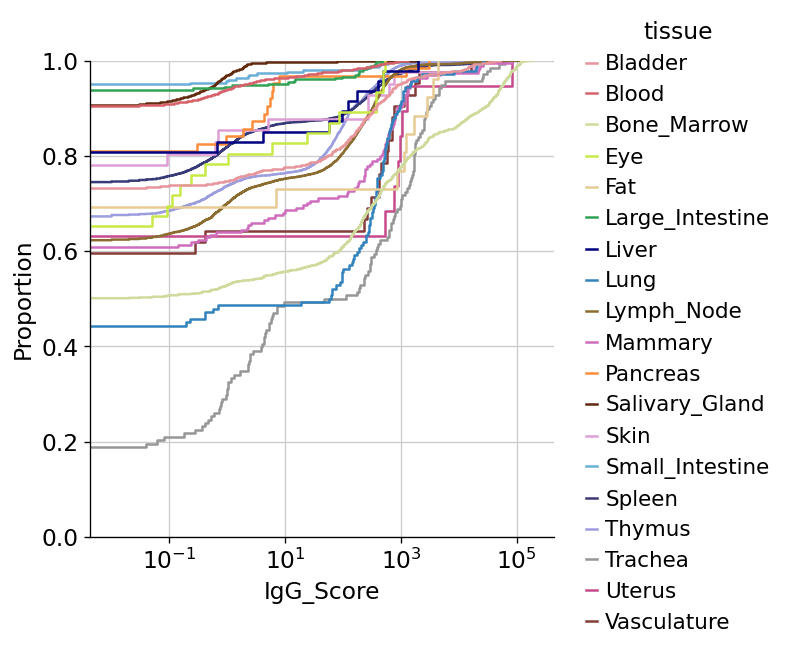

In [178]:
gene = 'IgG_Score'
label = 'tissue'
g = sns.displot(data = plotdf, x = gene, hue = label, kind='ecdf', palette=tissue_colors )
plt.xscale('log')

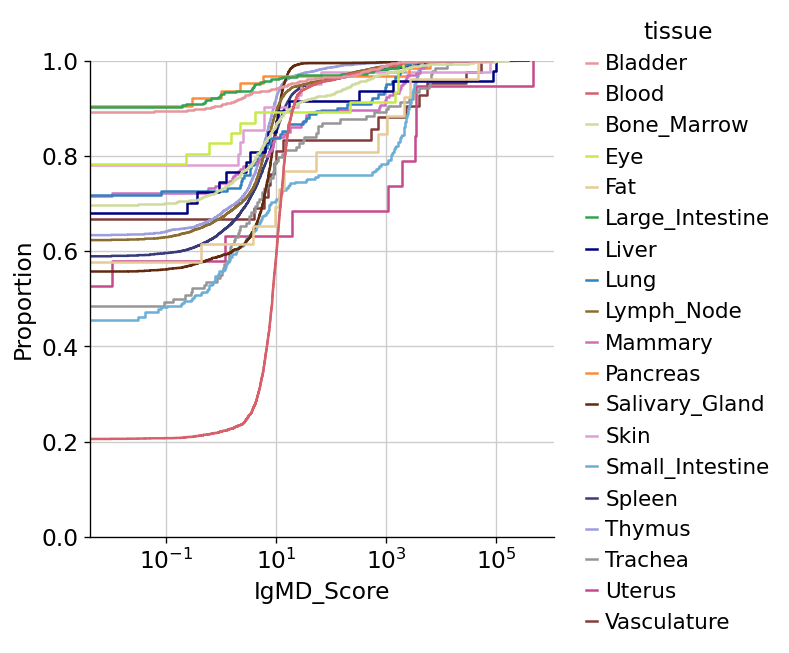

In [179]:
gene = 'IgMD_Score'
label = 'tissue'
g = sns.displot(data = plotdf, x = gene, hue = label, kind='ecdf', palette=tissue_colors )
plt.xscale('log')

In [206]:
data = plotdf[IGH_genes]

data = np.log10(data + 1)

data = preprocessing.normalize(data)

from sklearn.cluster import KMeans
from sklearn import preprocessing
from sklearn.decomposition import PCA

#pca = PCA(n_components=5).fit(data)

scaler = preprocessing.StandardScaler().fit(data)

data_scaled = scaler.transform(np.double(data))

import matplotlib.pyplot as plt

reduced_data = PCA(n_components=2).fit_transform(data_scaled)
kmeans = KMeans(init="k-means++", n_clusters=5, n_init=4)
kmeans.fit(reduced_data)

# Step size of the mesh. Decrease to increase the quality of the VQ.
h = .02     # point in the mesh [x_min, x_max]x[y_min, y_max].

# Plot the decision boundary. For that, we will assign a color to each
x_min, x_max = reduced_data[:, 0].min() - 1, reduced_data[:, 0].max() + 1
y_min, y_max = reduced_data[:, 1].min() - 1, reduced_data[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Obtain labels for each point in mesh. Use last trained model.
Z = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(1)
plt.clf()
plt.imshow(Z, interpolation="nearest",
           extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap=plt.cm.Paired, aspect="auto", origin="lower")

plt.plot(reduced_data[:, 0], reduced_data[:, 1], 'k.', markersize=2)
# Plot the centroids as a white X
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], marker="x", s=169, linewidths=3,
            color="w", zorder=10)
plt.title("K-means clustering on the digits dataset (PCA-reduced data)\n"
          "Centroids are marked with white cross")
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())
plt.show()

In [ ]:
# Shameless hacked from scanpy
scores = adata.obs[['IgG_Score', 'IgA_Score', 'IgMD_Score']]
phase = pd.Series('IgM/D', index=scores.index)

# if G2M is higher than S, it's G2M
phase[(scores.IgG_Score > scores.IgMD_Score) & (scores.IgG_Score > scores.IgA_Score)] = 'IgG'
phase[(scores.IgA_Score > scores.IgMD_Score) & (scores.IgA_Score > scores.IgG_Score)] = 'IgA'
# if all scores are negative, it's G1... not sure this applies here 
#phase[np.all(scores < 0, axis=1)] = 'IgM/D_default'

adataBLineage.obs['Isotype'] = phase

In [107]:
filtered_plotdf['kmeans'].value_counts()

1    11589
0     9811
2     1437
Name: kmeans, dtype: int64